# Reproducing Villena-Gonzalez CDA Study (2019) - Cleaning

## Notes
- Cleaning c'est subjectif. J'veux montrer une "trends". J'fais pas une thèse sur le cleaning... J'veux juste montrer entre raw est cleaned, on a un clearer CDA...
- Cleaning with AutoCorrect, déjà c'est mieux!

In [5]:
import numpy as np
import glob
import pickle

import mne
from mne import Epochs, pick_channels, find_events, concatenate_epochs
from mne.io import read_raw_bdf

import sys
sys.path.append('/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/')
from events import get_specific_events, get_epochs, get_CDA, prep_report, fill_report, get_report, checksum
 
from autoreject import AutoReject

import matplotlib.pyplot as plt
%matplotlib inline

## 1. Prep Data

Processing: LS150419.bdf...
Extracting EDF parameters from /Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/LS150419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 790527  =      0.000 ...   386.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65577 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65577 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
-------------------

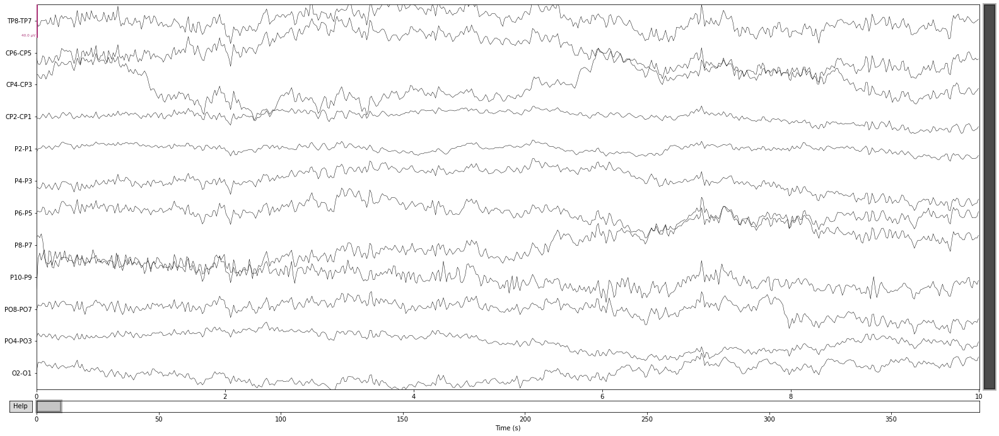

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (3 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-go

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
384 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
384 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

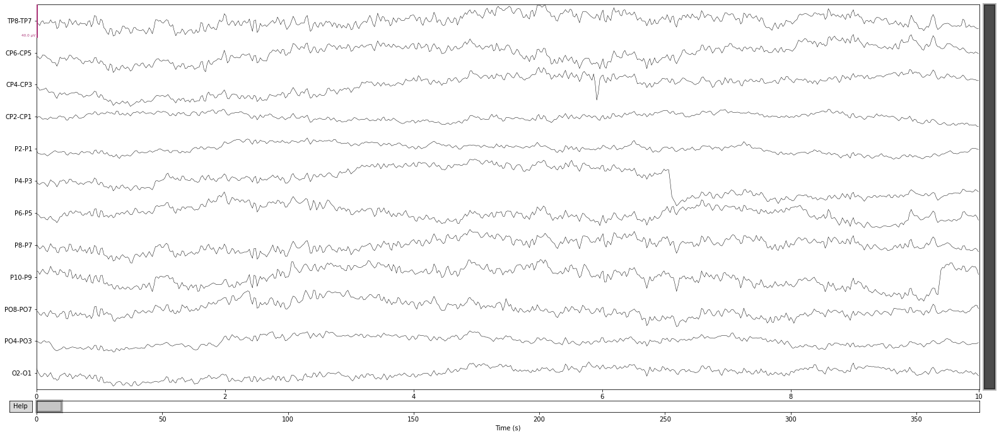

Total: 96 (0 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: LF210119.bdf...
Extracting EDF parameter

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

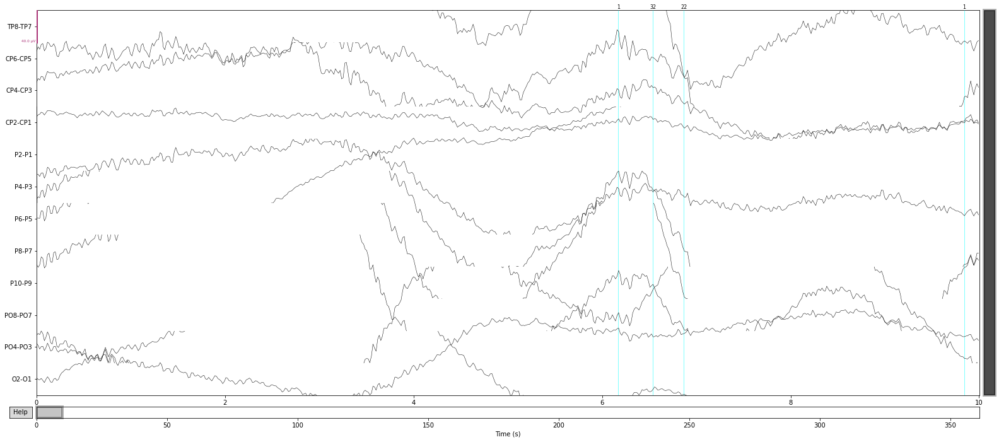

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (2 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------


/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
381 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
381 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

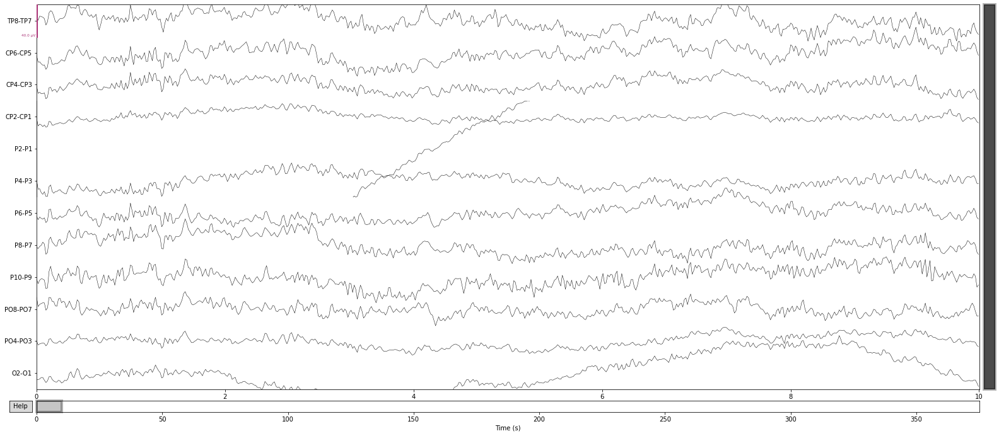

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (2 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------


/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: IP020519.bdf...
Extracting EDF parameters from /Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/IP020519.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 749567  =      0.000 ...   366.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider usin

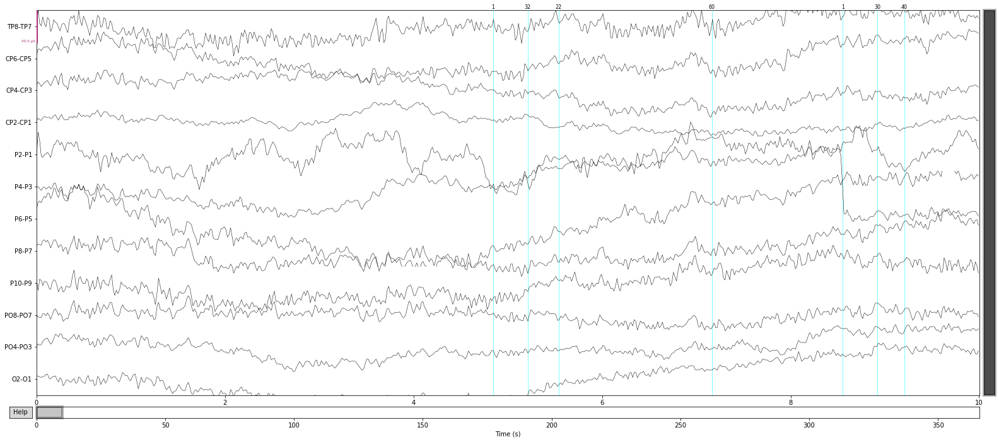

Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (1 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING =====================

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
380 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

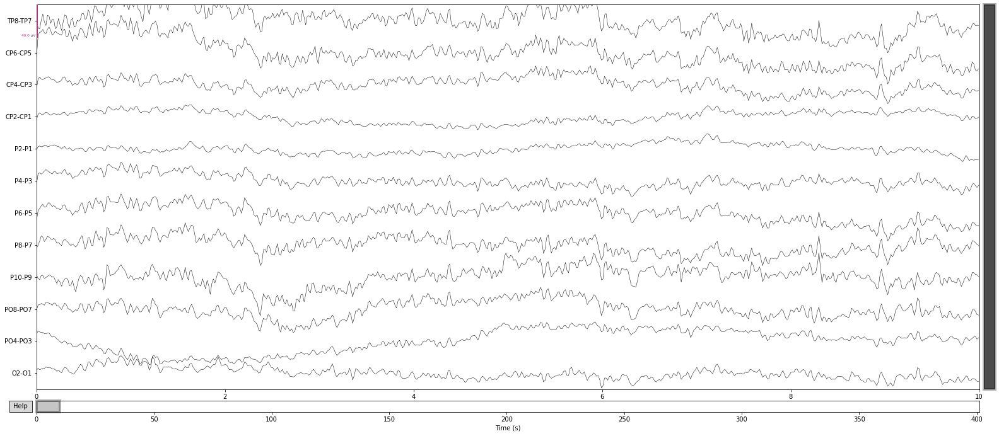

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (4 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
376 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
376 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

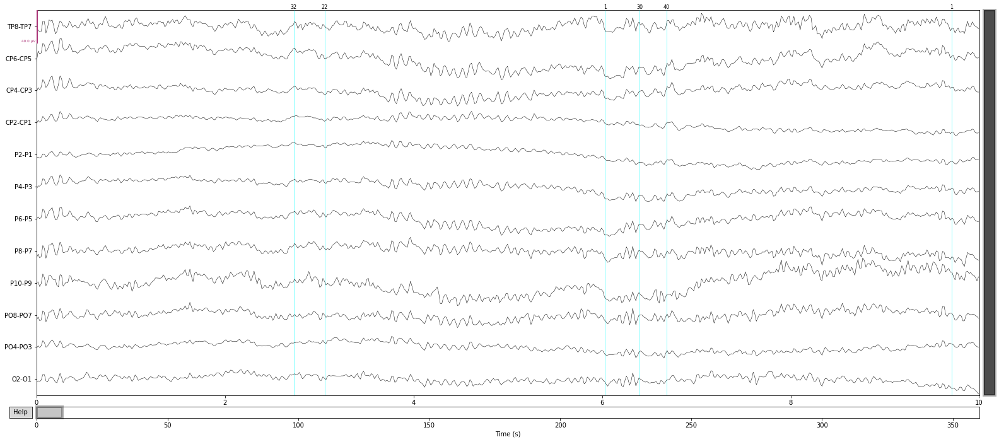

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (13 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items a

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
371 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
371 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

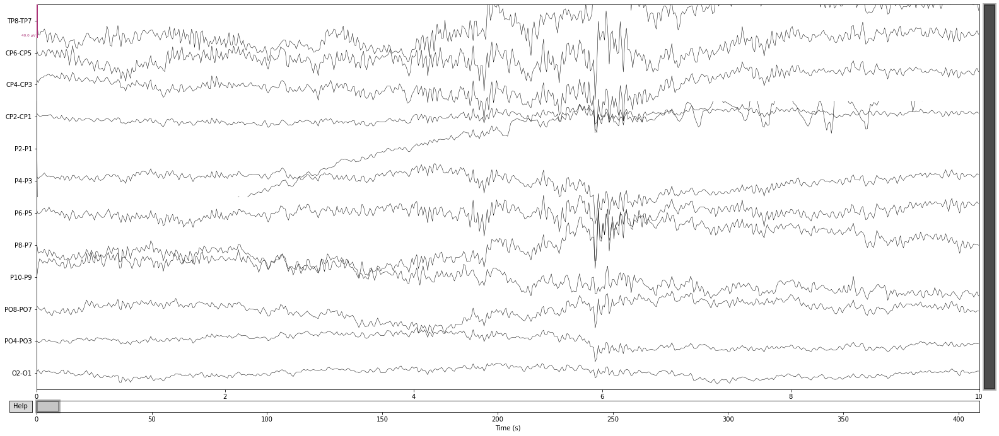

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no A

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

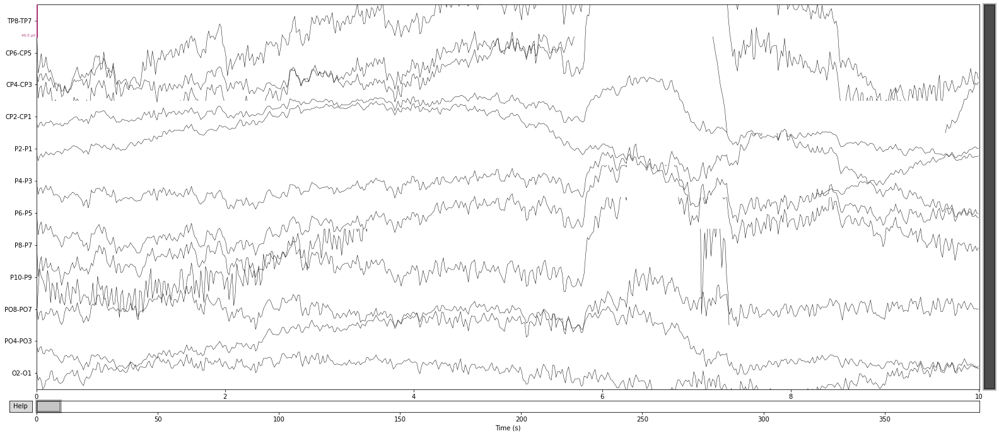

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (2 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------


/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
381 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
381 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

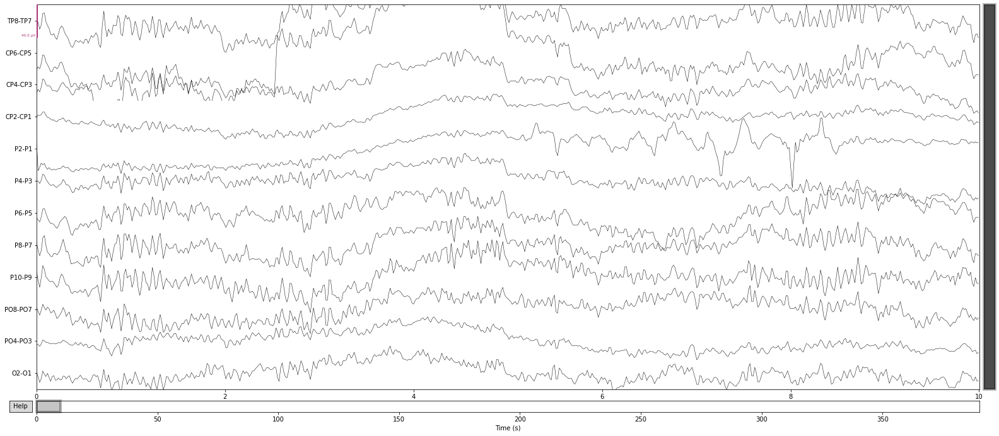

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (2 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------


/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

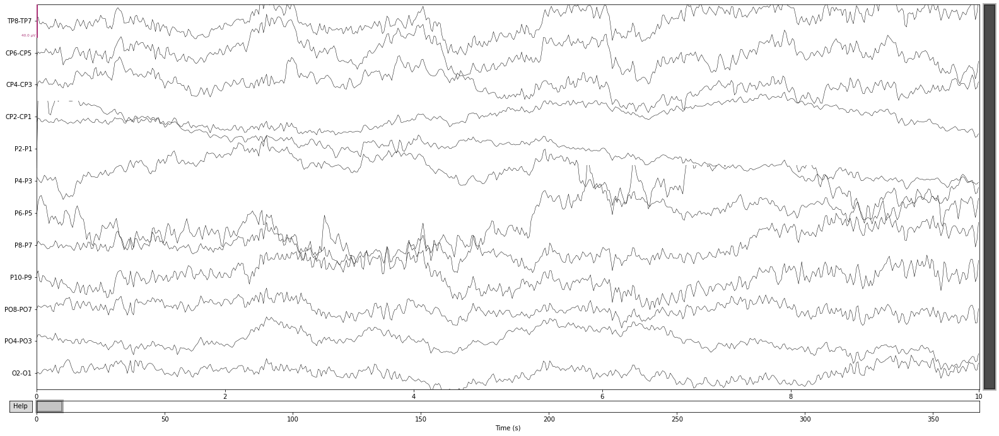

Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (1 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING =====================

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

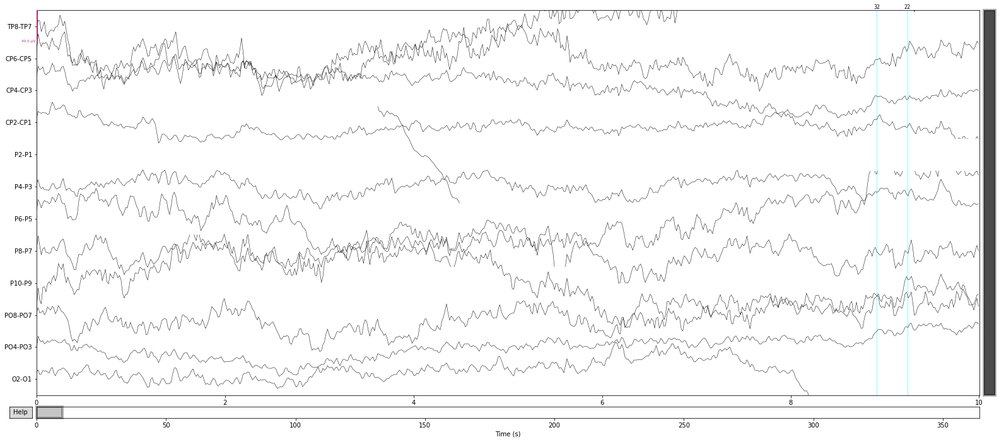

Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (1 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------


/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: JC220119.bdf...
Extracting EDF parameters from /Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/JC220119.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 767999  =      0.000 ...   375.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]

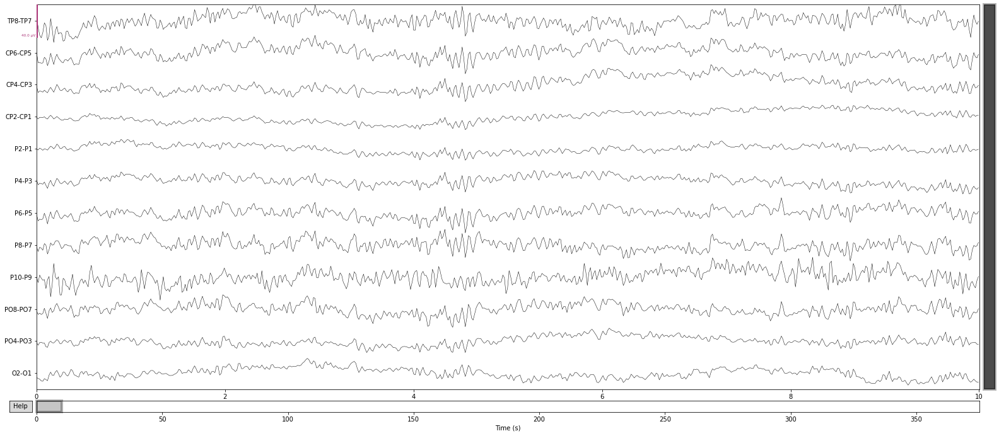

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (2 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------


/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
368 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
368 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

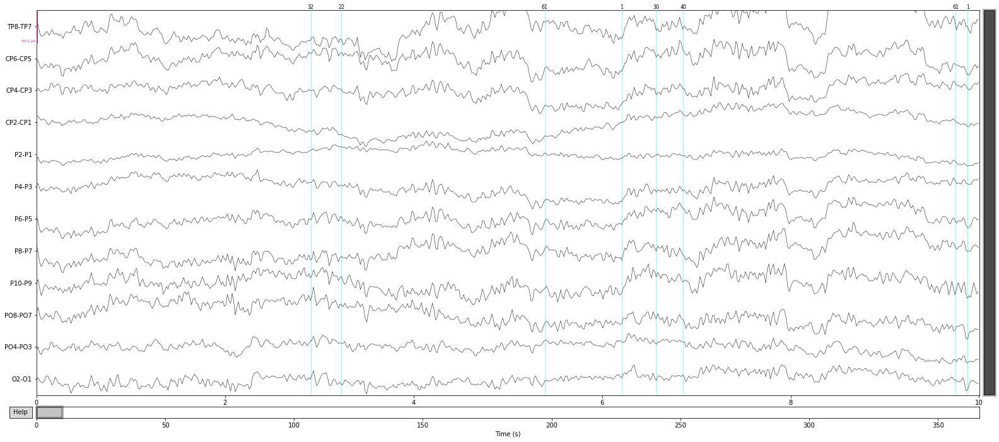

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no A

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65791 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

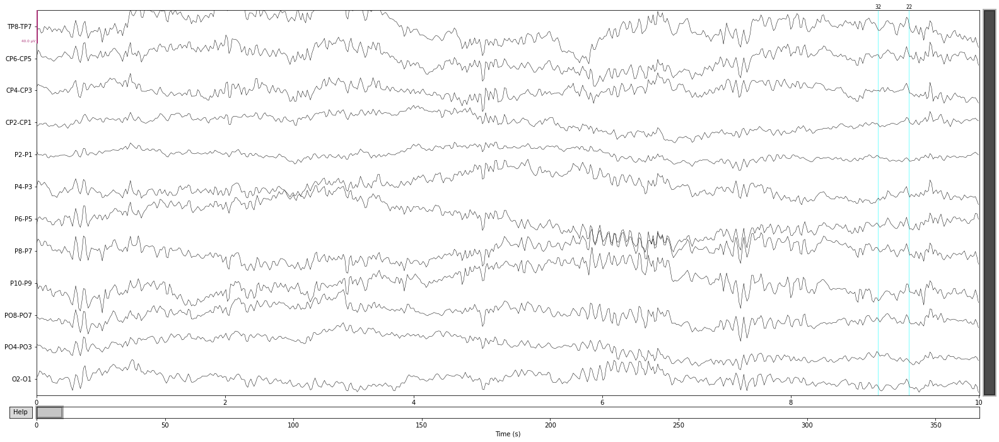

Total: 96 (0 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: ER290419.bdf...
Extracting EDF parameter

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')
/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_41206/3729937920.py:54: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  raw = read_raw_bdf(filepath, preload=True)


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1273 events found
Event IDs: [    1    10    11    12    13    20    21    22    23    30    31    32
    33    40    41    42    43    50    51    52    53    60    61    62
    63    64    65    66    67    68    69    70    71    72    73    74
    75    76    77    78    79    80    81 65536]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1273 events found
Event IDs: [    1    10    11    12    13    20    21    22    23    30    31    32
    33    40    41    42    43    50    51    52    53    60    61    62
    63    64    65    66    67    68    69    70    71    72    73    74
    75    76    77    78    79    80   

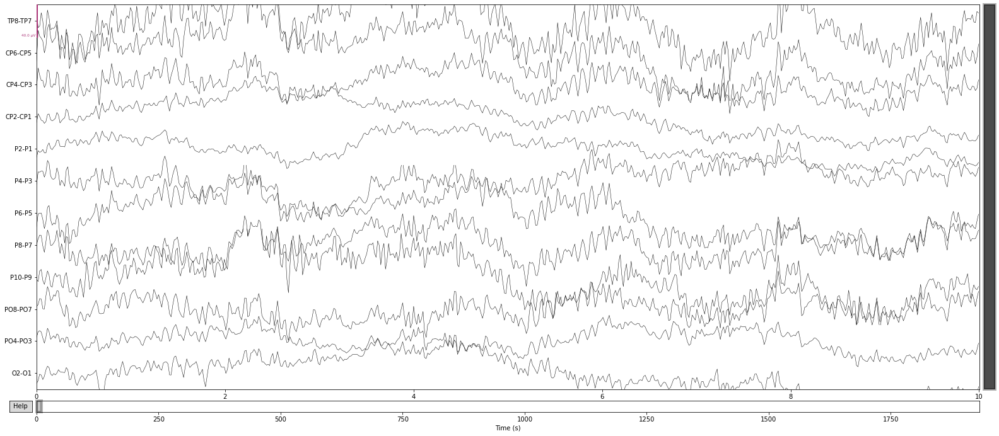

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no A

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no A

Not setting metadata
259 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 259 events and 1640 original time points ...


/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 259 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: BO090419.bdf...
Extracting EDF parameters from /Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/BO090419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 767999  =      0.000 ...   375.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65791 

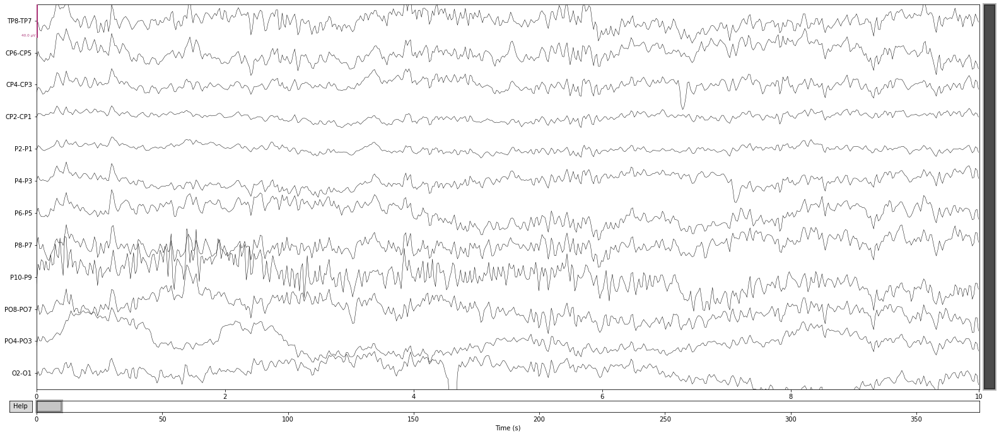

Total: 96 (0 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: RG100419.bdf...
Extracting EDF parameter

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65569 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65569 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

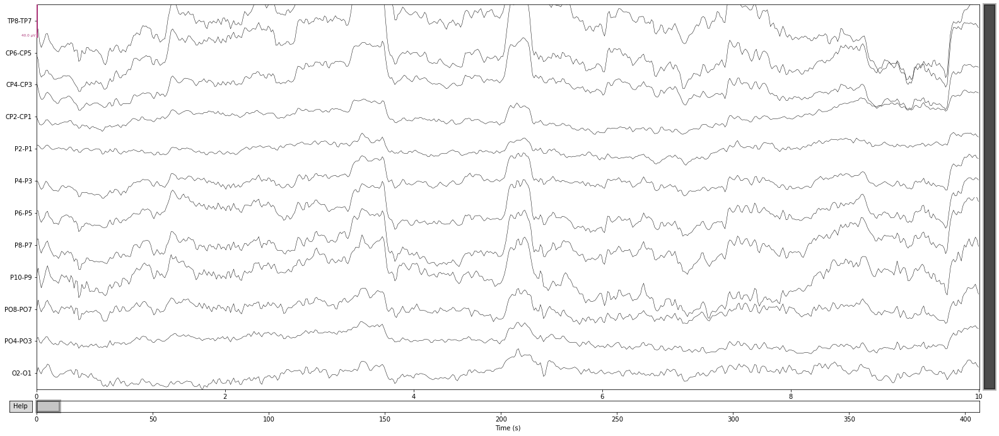

Total: 96 (0 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...


/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: MM220419.bdf...
Extracting EDF parameters from /Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/MM220419.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 811007  =      0.000 ...   396.000 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65559 (

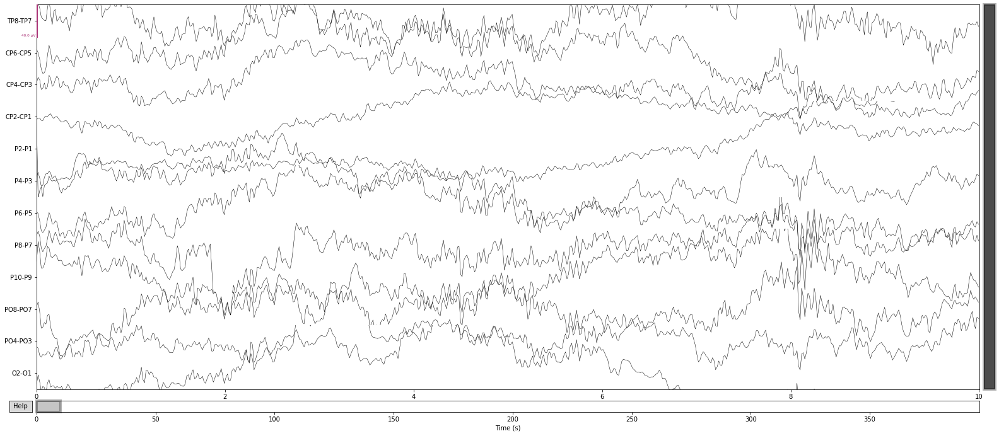

Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (1 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING =====================

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
384 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
384 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

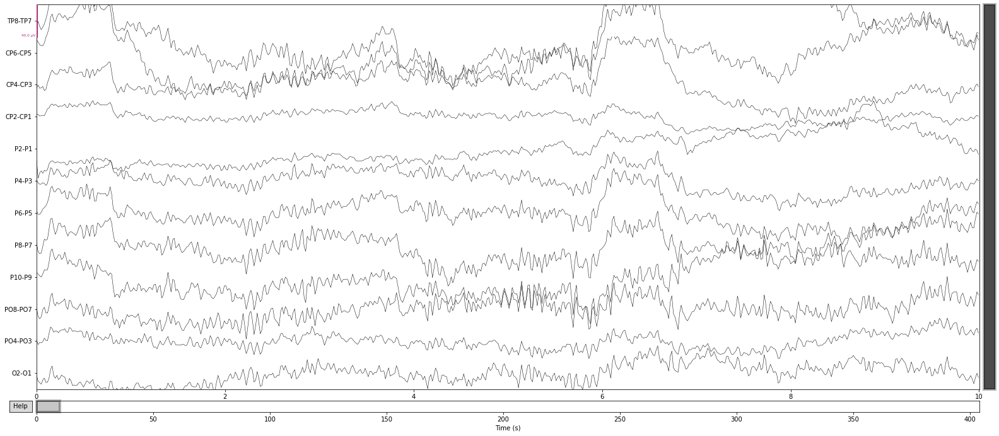

Total: 96 (0 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: SS150119.bdf...
Extracting EDF parameter

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
379 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
379 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

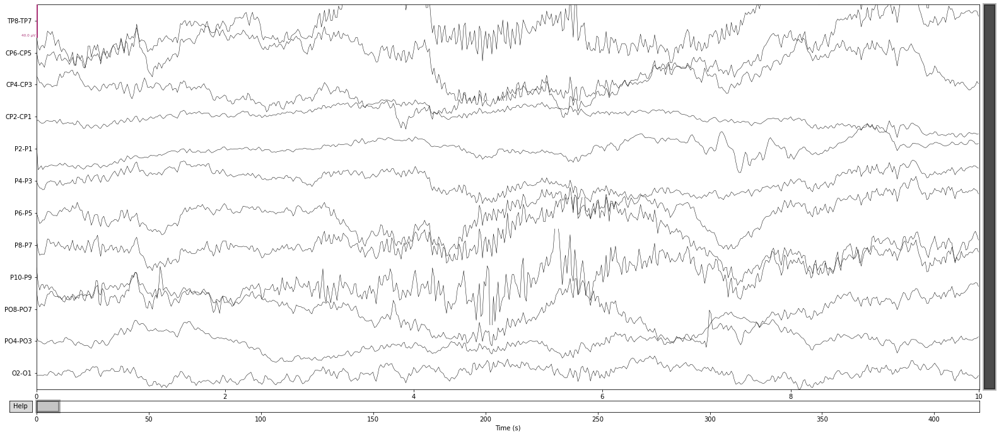

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (4 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65734 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
383 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

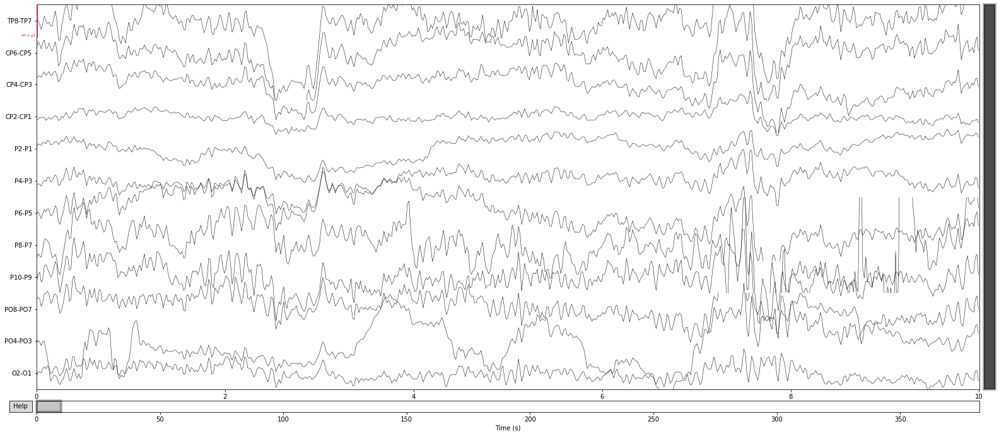

Total: 96 (0 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-good -------------
---------- 4-right-bad -------------
====================== /EPOCHING ======================
Processing: CM190319.bdf...
Extracting EDF parameter

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
382 events found
Event IDs: [ 1 10 11 12 13 20 21 22 23 30 31 32 33 40 41 42 43 60 61]
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.0

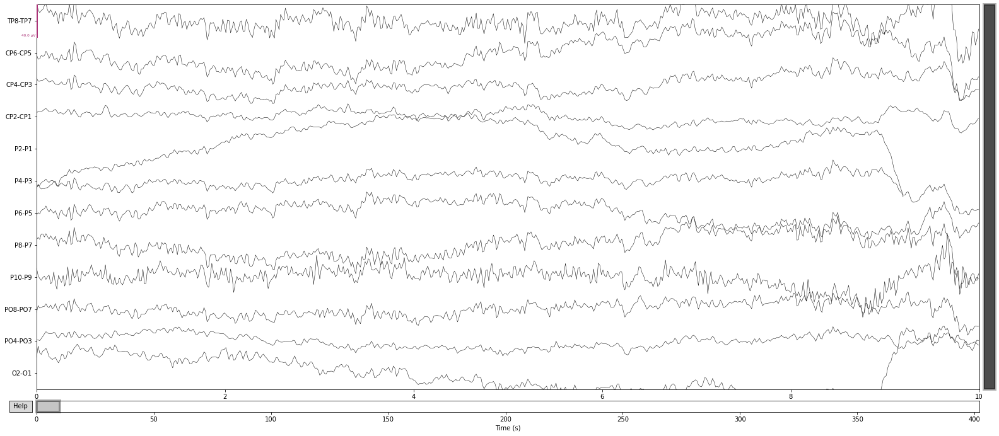

Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Overlapping Events with no Accuracy/Perf! Skipping...
Total: 96 (3 Skipped do to overlapping events with missing triggers.)
====================== EPOCHING ======================
tmin:-0.4, tmax:1.2, baseline=(-0.4, -0.2)
Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped
A total of 96 epochs were extracted and baseline corrected.
---------- 1-left-good -------------
---------- 1-left-bad -------------
---------- 1-right-good -------------
---------- 1-right-bad -------------
---------- 2-left-good -------------
---------- 2-left-bad -------------
---------- 2-right-good -------------
---------- 2-right-bad -------------
---------- 4-left-good -------------
---------- 4-left-bad -------------
---------- 4-right-go

/Users/nick/Documents/PhD/CLCT/reprod/studies/Villena-Gonzalez-2019/events.py:106: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


In [6]:
#==================================================================
# General Variables
#==================================================================
## Organize Triggers
triggers = dict();

# --------------------------
triggers['1'] = [10,11,12,13] 
triggers['2'] = [20,21,22,23]
triggers['4'] = [40,41,42,43]

triggers['left'] = [11,12,21,22,41,42]
triggers['right'] = [10,13,20,23,40,43]

triggers['good'] = [60]
triggers['bad'] = [61]

# Labels
conds = ['1', '2', '4']
sides = ['left', 'right']
perfs = ['good', 'bad']

# CDA Channels
chan_right = ['TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2']
chan_left =  ['TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1']

# Epoch information
epoch_length = 1.2
epoch_tmin = -0.4
baseline_corr = (-0.4, -0.2)

# CDA main variable!
cda_dict = dict()
cda_dict_clean = dict()
epochs_dict_all = dict()
report = prep_report(conds, sides, perfs)

#==================================================================
# Main Loop - Loading All Files & Extract CDAs.
#==================================================================
#directory_path = 'D:\\CLNT\\Data\\Open Datasets\\Villena-Gonzalez 2019\\Data\\'
directory_path = '/Users/nick/Documents/PhD/CDA Datasets/Villena-Gonzalez 2019/Data/'
sep = '/'

#filepath = directory_path + 'CS230419.bdf'

for filepath in glob.iglob(directory_path + '*.bdf'):
    filename = filepath[filepath.rfind(sep)+1:]
    print('Processing: ' + filename + '...')

    # ------------------------
    # 1. -- Load File --
    # ------------------------
    raw = read_raw_bdf(filepath, preload=True)

    # ------------------------
    # 2. -- Preprocessing --
    # ------------------------
    # Keep only EEG channels and reference
    #raw = raw.rename_channels({'EXG7':'A1', 'EXG8': 'A2'})
    raw = raw.drop_channels(ch_names=['EXG7','EXG8','EXG3','EXG4','EXG5','EXG6'])
    raw = raw.set_eeg_reference(ref_channels=['EXG1', 'EXG2'])
    raw = raw.set_channel_types({'EXG1': 'misc', 'EXG2': 'misc'})

    # Set Electrodes Locations
    montage = mne.channels.make_standard_montage('biosemi64')
    raw.set_montage(montage)

    # Resample
    preproc = raw.resample(1024)

    # Filter
    preproc = preproc.filter(.1, 20., fir_design='firwin', skip_by_annotation='edge')

    # Events
    events = find_events(preproc)

    # Chan Pairs
    chan_pairs = ['{}-{}'.format(chan_right[i], chan_left[i]) for i, chan in enumerate(chan_right)]

    for i, chan in enumerate(chan_right):
        preproc = mne.set_bipolar_reference(preproc, anode=[str(chan_right[i])], cathode=[str(chan_left[i])])
        #new_cda = cur_bipolar_epochs.pick_channels(['{}-{}'.format(chan_right[i], chan_left[i])]).average().data

    preproc = preproc.pick_channels(chan_pairs)

    # Plot (visual check)
    preproc.plot(events=events, block=True, lowpass=40)

    # ------------------------
    # 3. -- Epochs --
    # ------------------------
    specific_events = get_specific_events(events, conds, sides, perfs, triggers)

    epochs_dict = get_epochs(preproc, specific_events, epoch_length, epoch_tmin, baseline_corr)

    epochs_dict_all[filename] = epochs_dict

times = epochs_dict['2']['left']['good'].times

In [7]:
cda_all = dict()

for cond in epochs_dict_all[list(epochs_dict_all.keys())[0]].keys():
    cda_all[cond] = dict()
    cda_all[cond]['left'] = np.array([])
    cda_all[cond]['right'] = np.array([])

    for f in epochs_dict_all.keys():        
        perf = 'good'
        
        ldata = epochs_dict_all[f][cond]['left'][perf].average().data.mean(0)
        rdata = epochs_dict_all[f][cond]['right'][perf].average().data.mean(0)
                   
        cda_all[cond]['left'] = np.vstack([cda_all[cond]['left'], ldata]) if len(cda_all[cond]['left']) else ldata
        cda_all[cond]['right'] = np.vstack([cda_all[cond]['right'], rdata]) if len(cda_all[cond]['right']) else rdata

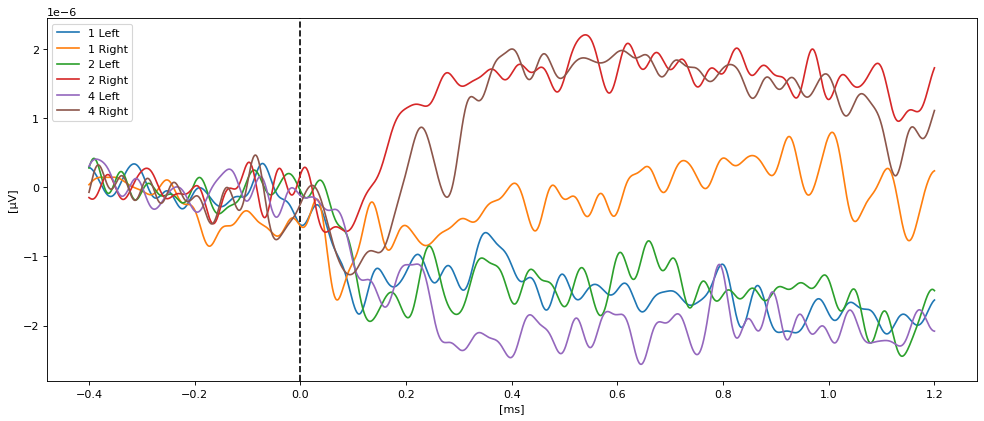

In [8]:
plt.figure(figsize=(15, 6), dpi=80)
plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times, cda_all['1']['left'].mean(0), label='1 Left')
plt.plot(times, cda_all['1']['right'].mean(0), label='1 Right')
plt.plot(times, cda_all['2']['left'].mean(0), label='2 Left')
plt.plot(times, cda_all['2']['right'].mean(0), label='2 Right')
plt.plot(times, cda_all['4']['left'].mean(0), label='4 Left')
plt.plot(times, cda_all['4']['right'].mean(0), label='4 Right')
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
plt.show()

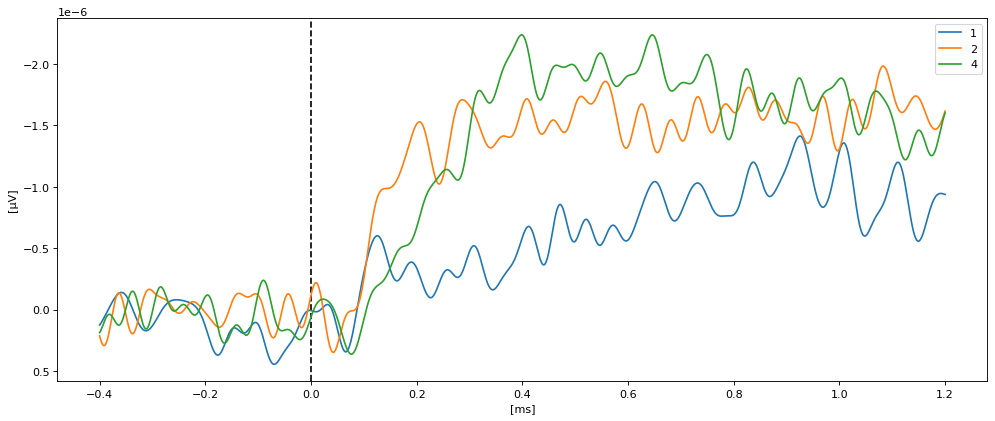

In [9]:
plt.figure(figsize=(15, 6), dpi=80)
plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times, (cda_all['1']['left'].mean(0) + (cda_all['1']['right'].mean(0) * -1)) /2, label='1')
plt.plot(times, (cda_all['2']['left'].mean(0) + (cda_all['2']['right'].mean(0) * -1)) /2, label='2')
plt.plot(times, (cda_all['4']['left'].mean(0) + (cda_all['4']['right'].mean(0) * -1)) /2, label='4')
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
plt.gca().invert_yaxis()
plt.show()

Text(0.5, 0, '[s]')

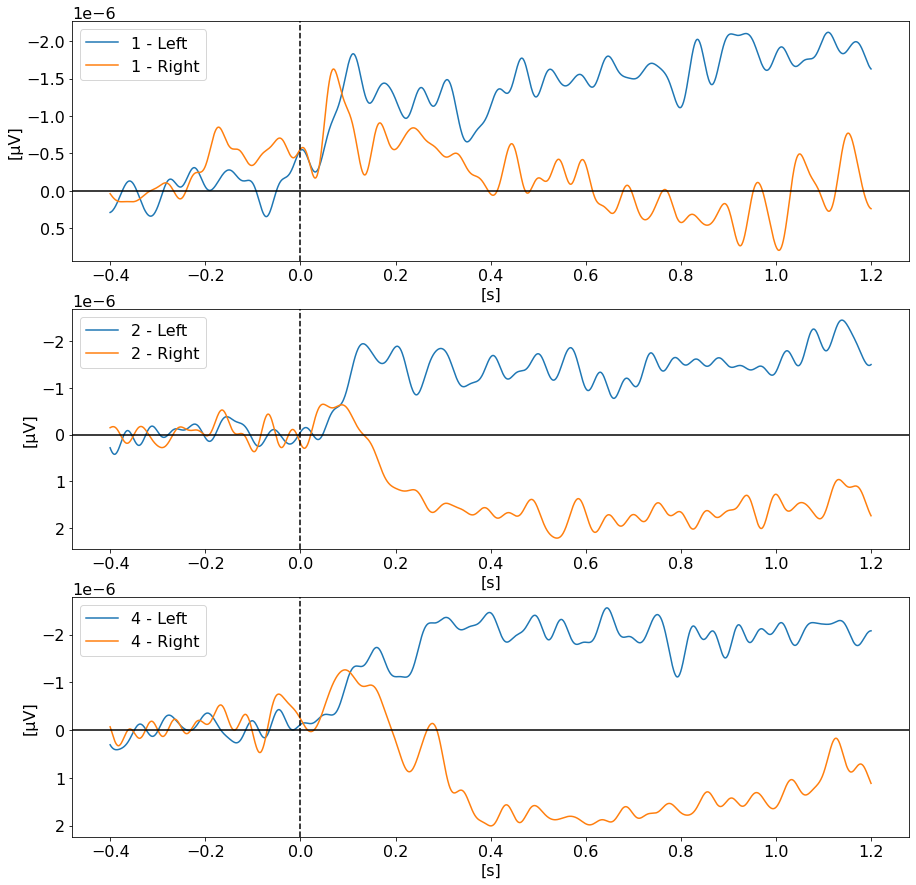

In [11]:
plt.rcParams.update({'font.size': 16})

fig, axs = plt.subplots(3, 1, figsize=(15,15))

# 2. Plot Figure #1
axs[0].plot(times, cda_all['1']['left'].mean(0), label='1 - Left')
axs[0].plot(times, cda_all['1']['right'].mean(0), label='1 - Right')
axs[0].axvline(x=0, color='k', linestyle='--')
axs[0].axhline(y=0, color='k', linestyle='-')
axs[0].invert_yaxis()
axs[0].legend()
axs[0].set_ylabel('[μV]')
axs[0].set_xlabel('[s]')

# 2. Plot Figure #2
axs[1].plot(times, cda_all['2']['left'].mean(0), label='2 - Left')
axs[1].plot(times, cda_all['2']['right'].mean(0), label='2 - Right')
axs[1].axvline(x=0, color='k', linestyle='--')
axs[1].axhline(y=0, color='k', linestyle='-')
axs[1].invert_yaxis()
axs[1].legend()
axs[1].set_ylabel('[μV]')
axs[1].set_xlabel('[s]')

# 2. Plot Figure #2
axs[2].plot(times, cda_all['4']['left'].mean(0), label='4 - Left')
axs[2].plot(times, cda_all['4']['right'].mean(0), label='4 - Right')
axs[2].axvline(x=0, color='k', linestyle='--')
axs[2].axhline(y=0, color='k', linestyle='-')
axs[2].invert_yaxis()
axs[2].legend()
axs[2].set_ylabel('[μV]')
axs[2].set_xlabel('[s]')

#plt.savefig("./V-2018-Exp1_CDA-reprod.png", dpi=300, format='png')

# Bad Trials

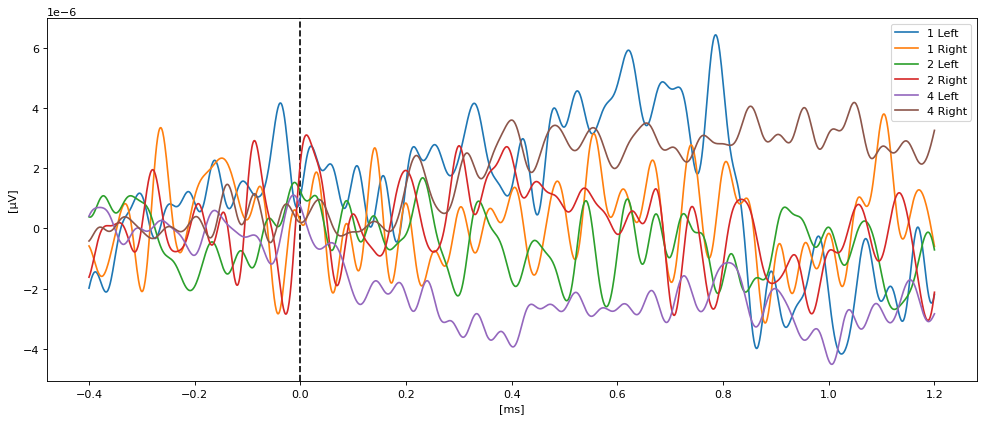

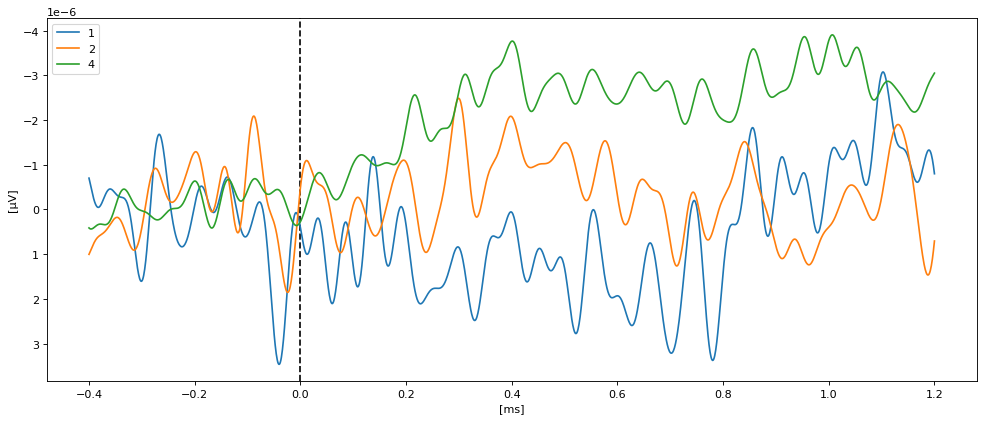

In [42]:
cda_all = dict()

for cond in epochs_dict_all[list(epochs_dict_all.keys())[0]].keys():
    cda_all[cond] = dict()
    cda_all[cond]['left'] = np.array([])
    cda_all[cond]['right'] = np.array([])

    for f in epochs_dict_all.keys():        
        perf = 'bad'
        
        if epochs_dict_all[f][cond]['left'][perf] is not None:
            ldata = epochs_dict_all[f][cond]['left'][perf].average().data.mean(0)
        if epochs_dict_all[f][cond]['right'][perf] is not None:
            rdata = epochs_dict_all[f][cond]['right'][perf].average().data.mean(0)
                   
        cda_all[cond]['left'] = np.vstack([cda_all[cond]['left'], ldata]) if len(cda_all[cond]['left']) else ldata
        cda_all[cond]['right'] = np.vstack([cda_all[cond]['right'], rdata]) if len(cda_all[cond]['right']) else rdata
        
plt.figure(figsize=(15, 6), dpi=80)
plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times, cda_all['1']['left'].mean(0), label='1 Left')
plt.plot(times, cda_all['1']['right'].mean(0), label='1 Right')
plt.plot(times, cda_all['2']['left'].mean(0), label='2 Left')
plt.plot(times, cda_all['2']['right'].mean(0), label='2 Right')
plt.plot(times, cda_all['4']['left'].mean(0), label='4 Left')
plt.plot(times, cda_all['4']['right'].mean(0), label='4 Right')
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
plt.show()

plt.figure(figsize=(15, 6), dpi=80)
plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times, (cda_all['1']['left'].mean(0) + (cda_all['1']['right'].mean(0) * -1)) /2, label='1')
plt.plot(times, (cda_all['2']['left'].mean(0) + (cda_all['2']['right'].mean(0) * -1)) /2, label='2')
plt.plot(times, (cda_all['4']['left'].mean(0) + (cda_all['4']['right'].mean(0) * -1)) /2, label='4')
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
plt.gca().invert_yaxis()
plt.show()

# Exploration

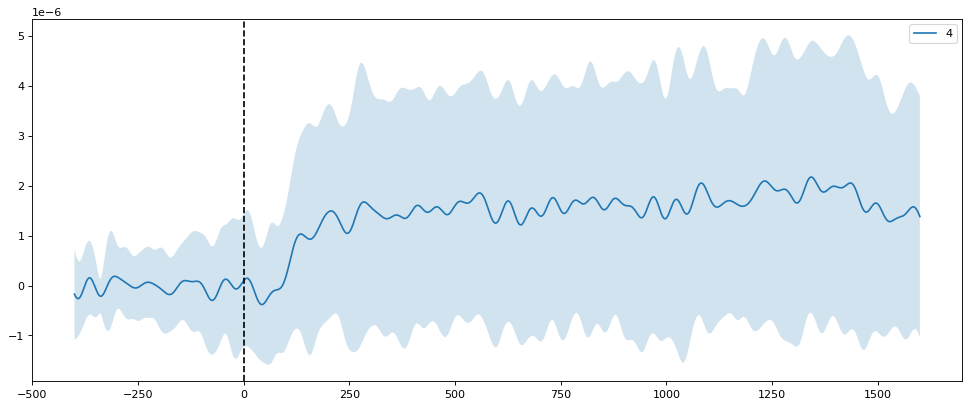

In [11]:
plt.figure(figsize=(15, 6), dpi=80)
means = cda_all['2'].mean(0)
stds = cda_all['2'].std(0)
plt.plot((times * 1000), means, label='4')
plt.fill_between((times * 1000), means-stds,means+stds,alpha=.2)

plt.axvline(x=0, color='k', linestyle='--')
#plt.gca().invert_yaxis()
plt.legend()
plt.show()

# CDA Raw vs Clean per Subject

In [ ]:
cda_all = dict()

for cond in cda_dict_clean[list(cda_dict.keys())[0]].keys():
    cda_all[cond] = dict()

    for f in cda_dict_clean.keys():
        #if f == 'ER290419.bdf' and cond == '1':
        #    continue
        
        perf = 'good'
        ldict = cda_dict_clean[f][cond]['left']
        rdict = cda_dict_clean[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_clean[f][cond]['left'][perf] + cda_dict_clean[f][cond]['right'][perf])/2            
            cda_all[cond] = np.vstack([cda_all[cond], cda_dict_cur]) if len(cda_all[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
        
plt.figure(figsize=(15, 6), dpi=80)
plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times, cda_all['1'].mean(0), label='1')
plt.plot(times, cda_all['2'].mean(0), label='2')
plt.plot(times, cda_all['4'].mean(0), label='4')
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
#plt.savefig("./img/Villena-Gonzalez-2019_CDA-reprod.jpg", dpi=300)

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_75670/2626503829.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 3, figsize=(15,15))


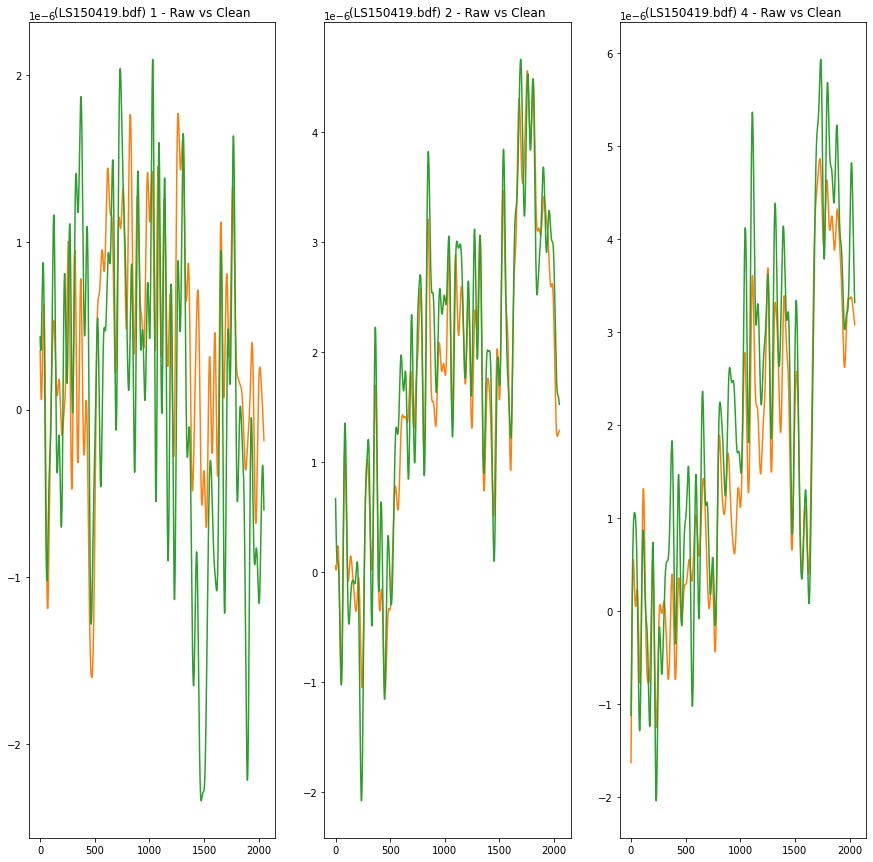

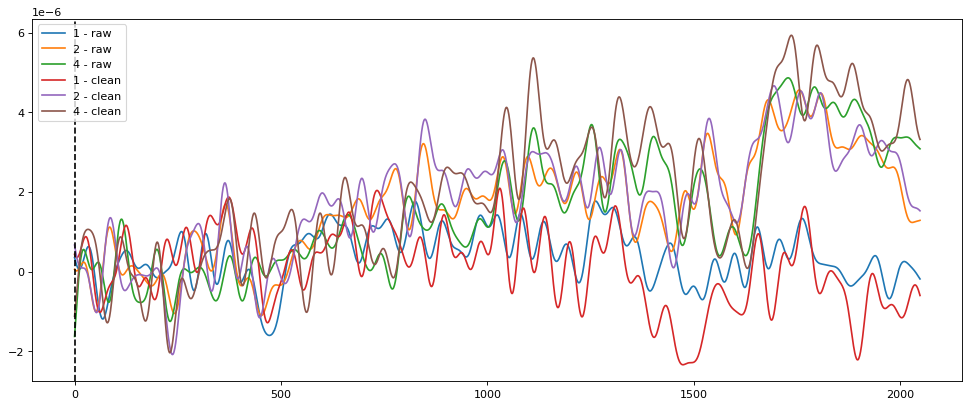

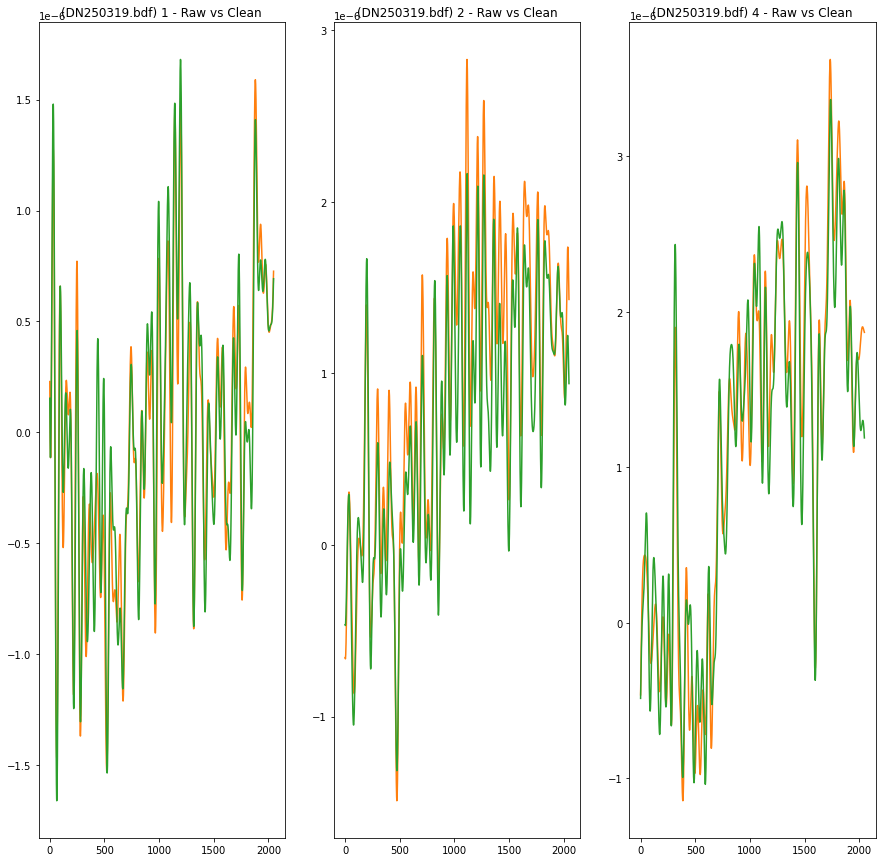

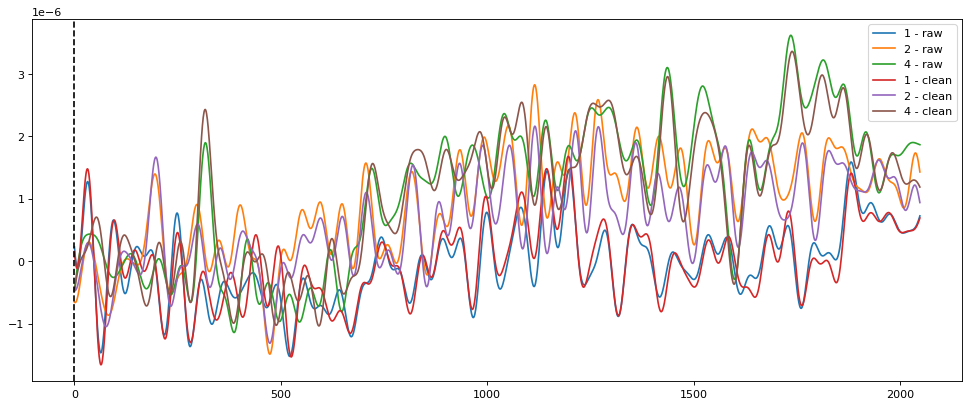

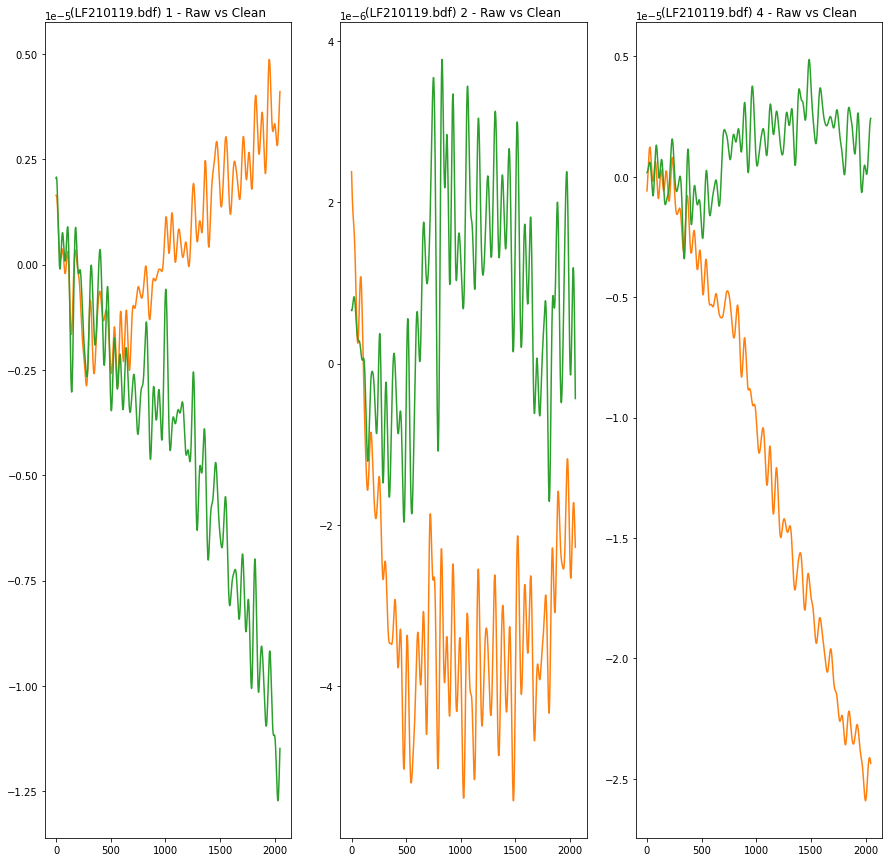

...

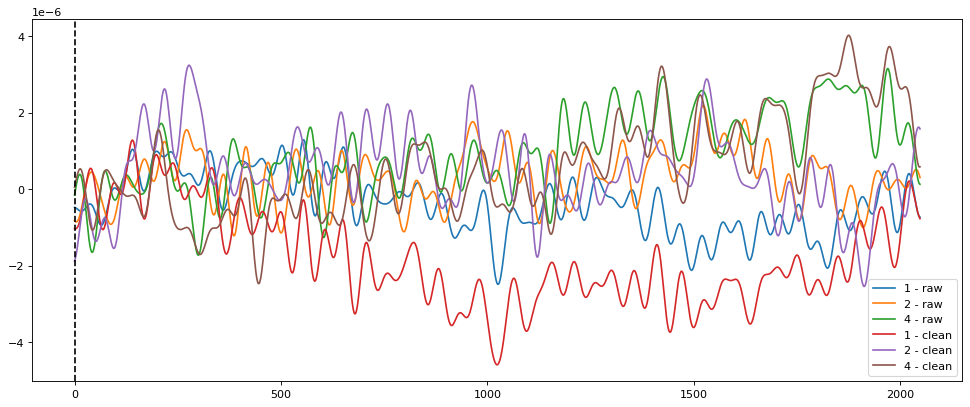

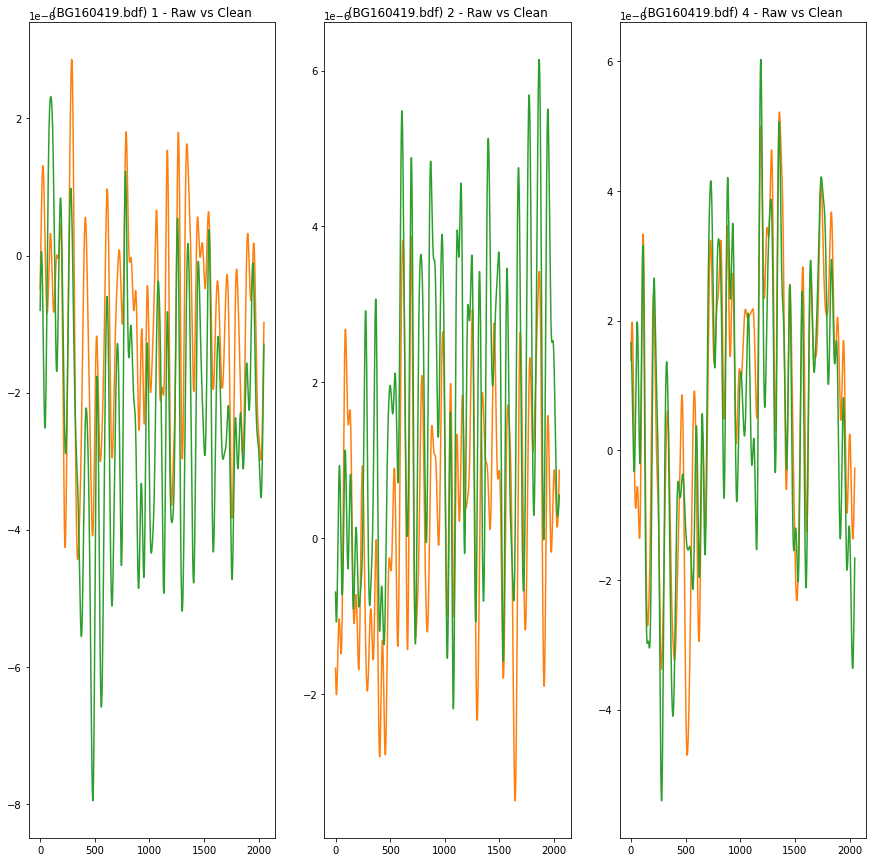

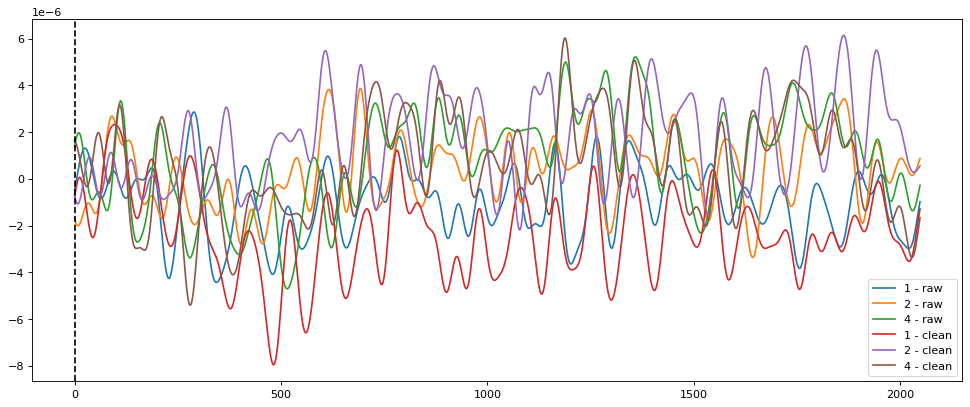

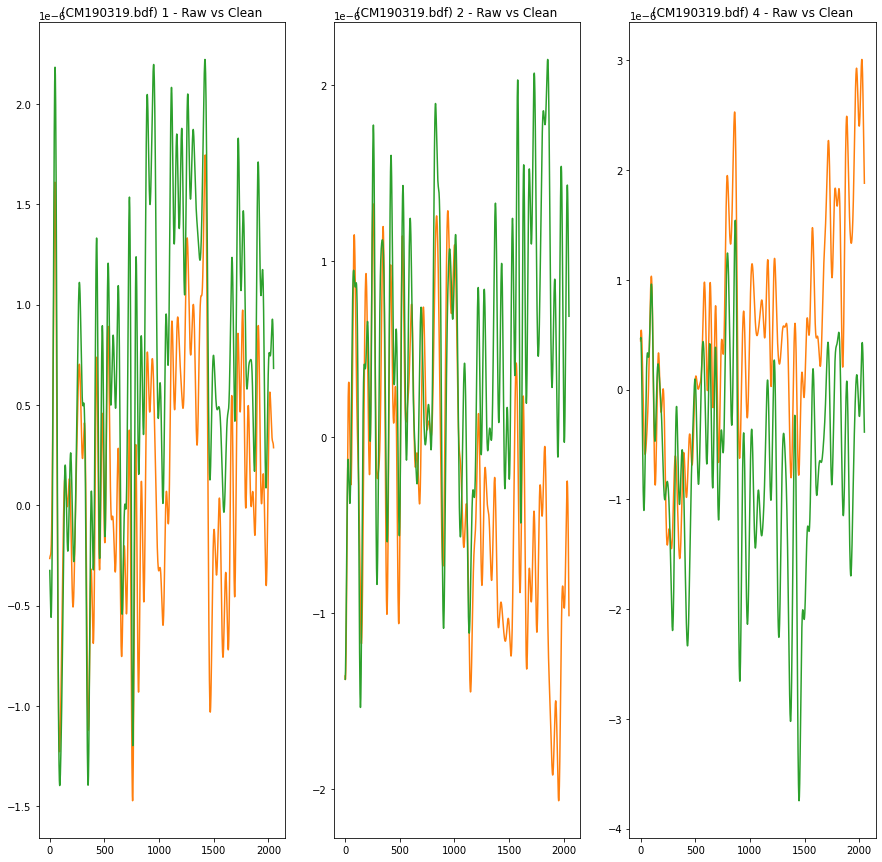

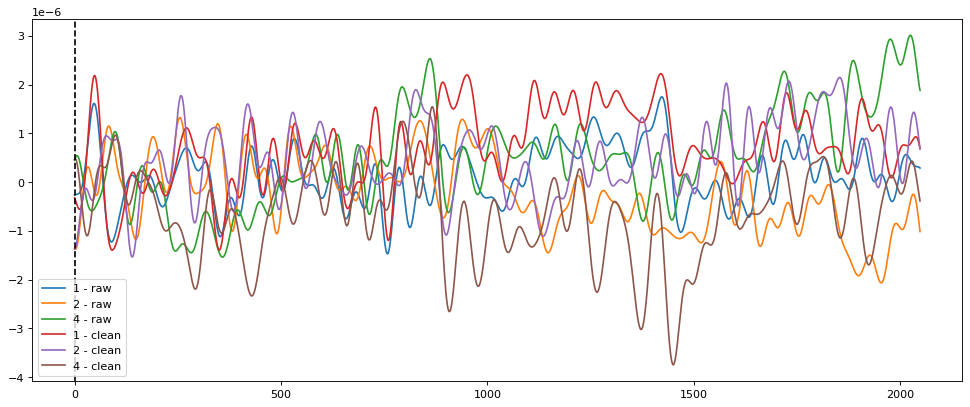

In [25]:
cda1_raw = []
cda1_clean = []
cda2_raw = []
cda2_clean = []
cda4_raw = []
cda4_clean = []
# perf = 'good'
for f in cda_dict_clean.keys():
    fig, axs = plt.subplots(1, 3, figsize=(15,15))
    for i, c in enumerate(conds):
        # Raw
        ldict = cda_dict[f][c]['left']
        rdict = cda_dict[f][c]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict[f][c]['left'][perf] + cda_dict[f][c]['right'][perf])/2
        else:
            cda_dict_cur = 0
        
        axs[i].plot(cda_dict_cur, 'tab:orange')
        
        if c == '1':
            cda1_raw = cda_dict_cur
        elif c == '2':
            cda2_raw = cda_dict_cur
        elif c == '4':
            cda4_raw = cda_dict_cur
        
        # Clean
        ldict = cda_dict_clean[f][c]['left']
        rdict = cda_dict_clean[f][c]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):            
            cda_dict_cur = (cda_dict_clean[f][c]['left'][perf] + cda_dict_clean[f][c]['right'][perf])/2
        else:
            cda_dict_cur = 0
            
        axs[i].plot(cda_dict_cur, 'tab:green')
        axs[i].set_title('({}) {} - Raw vs Clean'.format(f, c))
    
        if c == '1':
            cda1_clean = cda_dict_cur
        elif c == '2':
            cda2_clean = cda_dict_cur
        elif c == '4':
            cda4_clean = cda_dict_cur
            
    plt.figure(figsize=(15, 6), dpi=80)
    plt.plot(cda1_raw, label='1 - raw')
    plt.plot(cda2_raw, label='2 - raw')
    plt.plot(cda4_raw, label='4 - raw')
    plt.plot(cda1_clean, label='1 - clean')
    plt.plot(cda2_clean, label='2 - clean')
    plt.plot(cda4_clean, label='4 - clean')
    plt.axvline(x=0, color='k', linestyle='--')
    plt.legend()
    

In [7]:
all_events = []
for cur_cond in specific_events.keys():
    for cur_side in specific_events[cur_cond].keys():
        for cur_perf in specific_events[cur_cond][cur_side].keys():
            if len(specific_events[cur_cond][cur_side][cur_perf]):
                for e in specific_events[cur_cond][cur_side][cur_perf]:
                    all_events.append(e)

len(all_events)

96

In [8]:
all_epochs = Epochs(preproc, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')

Not setting metadata
Not setting metadata
96 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 96 events and 1640 original time points ...
0 bad epochs dropped


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_41028/4224250561.py:1: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(preproc, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')
